# Evaluating different tesseract training data sets and command line options

[Tesseract command line options](http://manpages.ubuntu.com/manpages/cosmic/man1/tesseract.1.html)

Running with `-l osd` produces some strange results. E.g. on `words.png` we see:

`Roma:test jk$ tesseract words.png stdout -l osd`
```
丁hе canada 且уnх く上упх сaпadепs夕sز 5৪ а
medduensted لعاorrh ﾑmeಗсап car
dreeddng асrоss வasкaو 0anada аnd
much വc rhe comdguous نവിed srares h
has юпgء dense run rrdangmar ears νधारh
లుаск rurrs апd droad рസﾒsء h 5৪ а good
smmmer апd chmtnarㅁ حر specdahst

predarorء the 且уnх depends heaeny оп
snoenshoe hares 者οr 꿈ооdو ννh5сh 且eаds to а ρreуبيةρredаror cуc且еو
аs ρopuلاапοпs or rhe mo specdes respond ro each otherㅁ 丁he
且упх hums аt mmghr or аr ndghtء аmdushmg hares аnd кипng
rhem dy dmng rhe head or throat رحاวغاter а gesrardon ρeಗоd വc
reno ro three momhsء up ro edghr кйюгю аrе dom ννh5сh аrе
ννeаned аr rhree monthsㅁ 丁h5s 且уกх occurs ρredommаവിу m
dense doread 者оresrsو 5rs range сойпс5d5ng ννটτh rhar or the hareㅁ
05νen 5rs аdundапсe апd по seνere rhrearsء rhe 0аnаdа 且уnх 5৪
```


## Tessdata eval
The following are results copied from `image_eval_data.xlsx` which document the results of running 8 example images through OCR with various `tesseract` command line paramaters and data sets which are documented below. Conclusion is that screen caps behave differently from digital pictures taken. The best tesseract training data and command line parameters differ depending on the source of the image. 

The `image_characteristics` notebook documents how to distinguish between the two types of pics. To wit, based on standard deviation of pixel color.


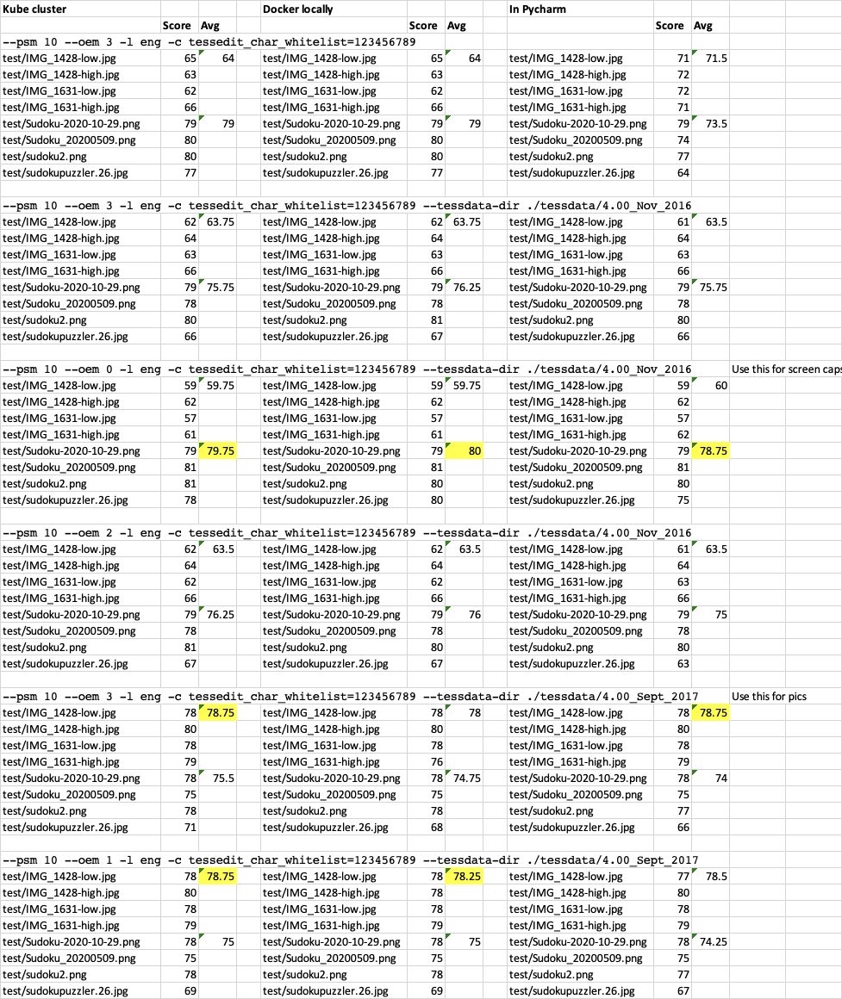

In [1]:
!tesseract -v

tesseract 4.1.1
 leptonica-1.80.0
  libgif 5.2.1 : libjpeg 9d : libpng 1.6.37 : libtiff 4.1.0 : zlib 1.2.11 : libwebp 1.1.0 : libopenjp2 2.3.1
 Found AVX2
 Found AVX
 Found FMA
 Found SSE


In [2]:
!pip install --upgrade pip
!pip install --user --upgrade "opencv-python"
!pip install --upgrade wget
!pip install --upgrade pytesseract

  Using cached pip-21.0-py3-none-any.whl (1.5 MB)
  Using cached pip-20.3.4-py2.py3-none-any.whl (1.5 MB)
  Using cached opencv_python-4.5.1.48-cp38-cp38-macosx_10_13_x86_64.whl (40.3 MB)
  Using cached opencv_python-4.4.0.46-cp38-cp38-macosx_10_13_x86_64.whl (52.4 MB)
  Using cached wget-3.2.zip (10 kB)
  Using cached wget-3.1.zip (10 kB)
  Using cached pytesseract-0.3.7-py2.py3-none-any.whl
  Using cached pytesseract-0.3.6.tar.gz (13 kB)


In [3]:
import os
import wget
import cv2 
import numpy
import time
import uuid
from matplotlib import pyplot
import pytesseract

In [4]:
import util
pyplot.rcParams['figure.dpi'] = 200

In [5]:
def print_matrix(matrix, title):
    print(title)
    for row in matrix:
        print(row)
    print()

In [6]:
def score_matrix(answer, key):
    total_correct = 0
    for row in range(0,9):
        for column in range(0,9):
            if answer[row][column] == key[row][column]:
                total_correct += 1
    return total_correct

In [7]:
images = [
    'IMG_1428-high.jpg',
    'IMG_1428-low.jpg',
    'IMG_1631-high.jpg',
    'IMG_1631-low.jpg',
    'sudoku2.png',
    'Sudoku-2020-10-29.png',
    'Sudoku_20200509.png',
    'sudokupuzzler.26.jpg'
]

In [8]:
def run_test(tesseract_config, display_image=True):
    image_path = 'test/IMG_1428-low.jpg'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image, tesseract_config)

    answer_key = [[0,0,0,0,0,0,0,0,4],
              [8,0,9,0,1,5,0,3,0],
              [0,5,6,0,2,0,0,0,9],
              [0,0,0,7,6,0,0,0,0],
              [0,0,2,0,5,0,9,0,0],
              [0,0,0,0,3,8,0,0,0],
              [7,0,0,0,8,0,6,4,0],
              [0,6,0,9,4,0,8,0,7],
              [5,0,0,0,0,0,0,0,0]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))
    if display_image:
        util.show_image(image_with_ocr, image_path)

    image_path = 'test/IMG_1428-high.jpg'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image, tesseract_config)

    answer_key = [[0,0,0,0,0,0,0,0,4],
              [8,0,9,0,1,5,0,3,0],
              [0,5,6,0,2,0,0,0,9],
              [0,0,0,7,6,0,0,0,0],
              [0,0,2,0,5,0,9,0,0],
              [0,0,0,0,3,8,0,0,0],
              [7,0,0,0,8,0,6,4,0],
              [0,6,0,9,4,0,8,0,7],
              [5,0,0,0,0,0,0,0,0]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))
    if display_image:
        util.show_image(image_with_ocr, image_path)
        
    image_path = 'test/IMG_1631-low.jpg'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image, tesseract_config)

    answer_key = [[0,0,0,0,0,0,0,0,4],
                  [8,0,9,0,1,5,0,3,0],
                  [0,5,6,0,2,0,0,0,9],
                  [0,0,0,7,6,0,0,0,0],
                  [0,0,2,0,5,0,9,0,0],
                  [0,0,0,0,3,8,0,0,0],
                  [7,0,0,0,8,0,6,4,0],
                  [0,6,0,9,4,0,8,0,7],
                  [5,0,0,0,0,0,0,0,0]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))
    if display_image:
        util.show_image(image_with_ocr, image_path)

    image_path = 'test/IMG_1631-high.jpg'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image, tesseract_config)

    answer_key = [[0,0,0,0,0,0,0,0,4],
                  [8,0,9,0,1,5,0,3,0],
                  [0,5,6,0,2,0,0,0,9],
                  [0,0,0,7,6,0,0,0,0],
                  [0,0,2,0,5,0,9,0,0],
                  [0,0,0,0,3,8,0,0,0],
                  [7,0,0,0,8,0,6,4,0],
                  [0,6,0,9,4,0,8,0,7],
                  [5,0,0,0,0,0,0,0,0]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))
    if display_image:
        util.show_image(image_with_ocr, image_path)


    image_path = 'test/Sudoku-2020-10-29.png'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image, tesseract_config)

    answer_key = [[0,0,0,0,0,0,0,0,0],
                  [0,0,0,0,0,3,0,8,5],
                  [0,0,1,0,2,0,0,0,0],
                  [0,0,0,5,0,7,0,0,0],
                  [0,0,4,0,0,0,1,0,0],
                  [0,9,0,0,0,0,0,0,0],
                  [5,0,0,0,0,0,0,7,3],
                  [0,0,2,0,1,0,0,0,0],
                  [0,0,0,0,4,0,0,0,9]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))
    if display_image:
        util.show_image(image_with_ocr, image_path)

    image_path = 'test/Sudoku_20200509.png'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image, tesseract_config)

    answer_key = [[0,4,0,0,9,0,0,0,2],
                  [2,0,0,0,0,3,0,0,7],
                  [8,6,0,0,0,7,0,9,0],
                  [0,0,0,0,6,5,0,2,0],
                  [5,0,0,0,0,0,0,0,9],
                  [0,9,0,7,3,0,0,0,0],
                  [0,8,0,1,0,0,0,4,3],
                  [1,0,0,4,0,0,0,0,6],
                  [4,0,0,0,2,0,0,5,0]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))
    if display_image:
        util.show_image(image_with_ocr, image_path)

    image_path = 'test/sudoku2.png'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image, tesseract_config)

    answer_key = [[0,0,0,8,5,0,0,0,7],
                  [3,8,2,0,0,0,0,0,0],
                  [9,0,7,0,3,0,1,8,4],
                  [0,2,8,0,0,6,0,3,0],
                  [4,0,9,0,0,0,8,0,1],
                  [0,3,0,9,0,0,4,7,0],
                  [7,1,3,0,6,0,2,0,8],
                  [0,0,0,0,0,0,5,1,6],
                  [2,0,0,0,9,8,0,0,0]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))
    if display_image:
        util.show_image(image_with_ocr, image_path)

    image_path = 'test/sudokupuzzler.26.jpg'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image, tesseract_config)

    answer_key = [[0,0,0,5,0,1,0,0,0],
                  [0,9,1,0,0,8,0,5,0],
                  [0,0,8,0,9,0,1,4,0],
                  [1,0,0,0,5,0,0,2,9],
                  [0,0,5,2,4,9,7,0,0],
                  [2,7,0,0,8,0,0,0,4],
                  [0,5,4,0,3,0,6,0,0],
                  [0,6,0,7,0,0,9,3,0],
                  [0,0,0,9,0,5,0,0,0]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))
    if display_image:
        util.show_image(image_with_ocr, image_path)


In [10]:
    image_path = 'test/sudokupuzzler.26.jpg'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    input_matrix, image_with_ocr = util.extract_matrix_from_image(image)

    answer_key = [[0,0,0,5,0,1,0,0,0],
                  [0,9,1,0,0,8,0,5,0],
                  [0,0,8,0,9,0,1,4,0],
                  [1,0,0,0,5,0,0,2,9],
                  [0,0,5,2,4,9,7,0,0],
                  [2,7,0,0,8,0,0,0,4],
                  [0,5,4,0,3,0,6,0,0],
                  [0,6,0,7,0,0,9,3,0],
                  [0,0,0,9,0,5,0,0,0]]

    score = score_matrix(input_matrix, answer_key)
    print('Image: %s \t\tScore: %s' % (image_path, score))

Image: test/sudokupuzzler.26.jpg 		Score: 72


# Default data

In [19]:
run_test('--psm 10 --oem 3 -l eng -c tessedit_char_whitelist=123456789', display_image=False)
# With oem values of 0,1,2, this fails with the following error:
# Error: Tesseract (legacy) engine requested, but components are not present in /usr/local/share/tessdata/eng.traineddata!! 

Image: test/IMG_1428-low.jpg 		Score: 71
Image: test/IMG_1428-high.jpg 		Score: 72
Image: test/IMG_1631-low.jpg 		Score: 72
Image: test/IMG_1631-high.jpg 		Score: 71
Image: test/Sudoku-2020-10-29.png 		Score: 79
Image: test/Sudoku_20200509.png 		Score: 74
Image: test/sudoku2.png 		Score: 77
Image: test/sudokupuzzler.26.jpg 		Score: 67


In [20]:
run_test('--psm 10 --oem 3 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Nov_2016', display_image=False)

Image: test/IMG_1428-low.jpg 		Score: 61
Image: test/IMG_1428-high.jpg 		Score: 64
Image: test/IMG_1631-low.jpg 		Score: 63
Image: test/IMG_1631-high.jpg 		Score: 65
Image: test/Sudoku-2020-10-29.png 		Score: 79
Image: test/Sudoku_20200509.png 		Score: 78
Image: test/sudoku2.png 		Score: 80
Image: test/sudokupuzzler.26.jpg 		Score: 63


In [21]:
run_test('--psm 10 --oem 0 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Nov_2016', display_image=False)
# This test fails with oem value of 1
#
# This is the best for screen caps

Image: test/IMG_1428-low.jpg 		Score: 59
Image: test/IMG_1428-high.jpg 		Score: 62
Image: test/IMG_1631-low.jpg 		Score: 57
Image: test/IMG_1631-high.jpg 		Score: 62
Image: test/Sudoku-2020-10-29.png 		Score: 79
Image: test/Sudoku_20200509.png 		Score: 81
Image: test/sudoku2.png 		Score: 80
Image: test/sudokupuzzler.26.jpg 		Score: 75


In [22]:
run_test('--psm 10 --oem 2 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Nov_2016', display_image=False)

Image: test/IMG_1428-low.jpg 		Score: 61
Image: test/IMG_1428-high.jpg 		Score: 64
Image: test/IMG_1631-low.jpg 		Score: 63
Image: test/IMG_1631-high.jpg 		Score: 66
Image: test/Sudoku-2020-10-29.png 		Score: 79
Image: test/Sudoku_20200509.png 		Score: 78
Image: test/sudoku2.png 		Score: 80
Image: test/sudokupuzzler.26.jpg 		Score: 63


In [23]:
run_test('--psm 10 --oem 3 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Sept_2017', display_image=False)
# This test fails with oem value of 0 and 2
#
# This is tied for the best for digital photos

Image: test/IMG_1428-low.jpg 		Score: 77
Image: test/IMG_1428-high.jpg 		Score: 80
Image: test/IMG_1631-low.jpg 		Score: 78
Image: test/IMG_1631-high.jpg 		Score: 79
Image: test/Sudoku-2020-10-29.png 		Score: 78
Image: test/Sudoku_20200509.png 		Score: 75
Image: test/sudoku2.png 		Score: 77
Image: test/sudokupuzzler.26.jpg 		Score: 69


In [24]:
run_test('--psm 10 --oem 1 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Sept_2017', display_image=False)
#
# This is tied for the best for digital photos

Image: test/IMG_1428-low.jpg 		Score: 77
Image: test/IMG_1428-high.jpg 		Score: 80
Image: test/IMG_1631-low.jpg 		Score: 78
Image: test/IMG_1631-high.jpg 		Score: 79
Image: test/Sudoku-2020-10-29.png 		Score: 78
Image: test/Sudoku_20200509.png 		Score: 75
Image: test/sudoku2.png 		Score: 77
Image: test/sudokupuzzler.26.jpg 		Score: 70


Image: test/IMG_1428-low.jpg 		Score: 71


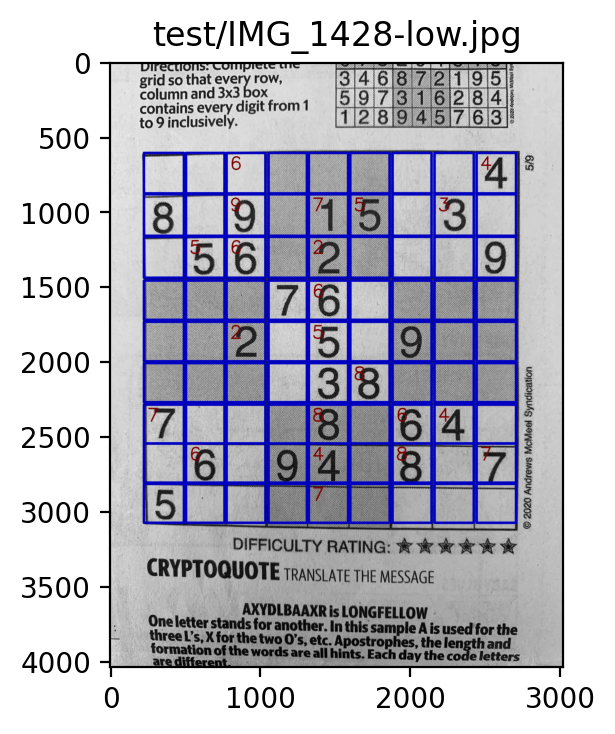

Image: test/IMG_1428-high.jpg 		Score: 72


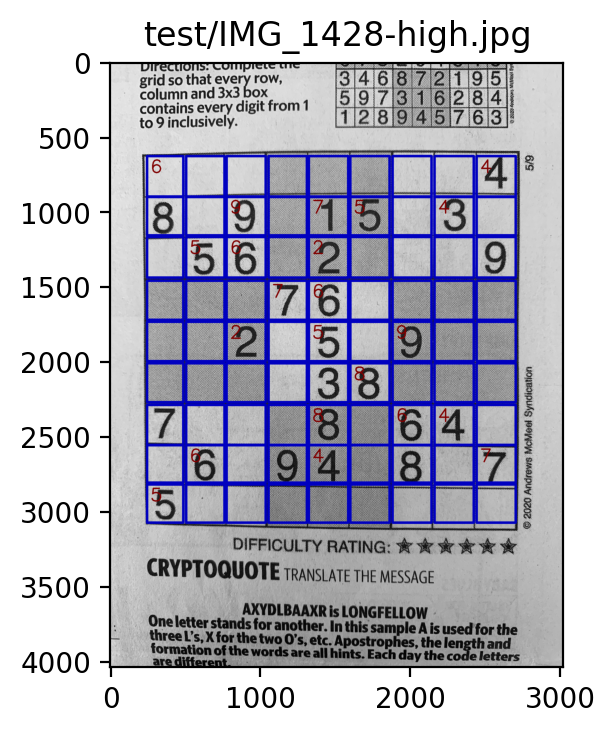

Image: test/IMG_1631-low.jpg 		Score: 72


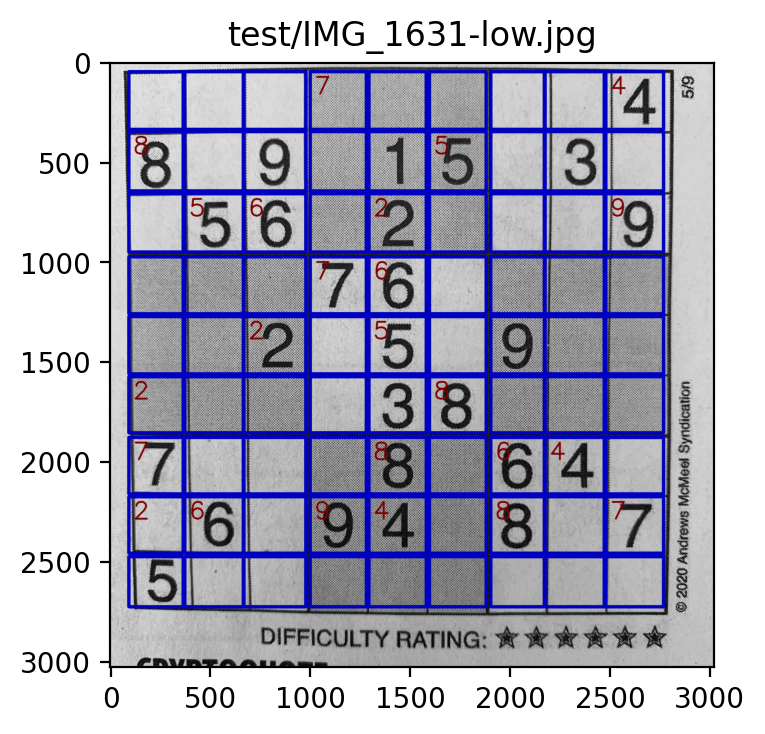

Image: test/IMG_1631-high.jpg 		Score: 71


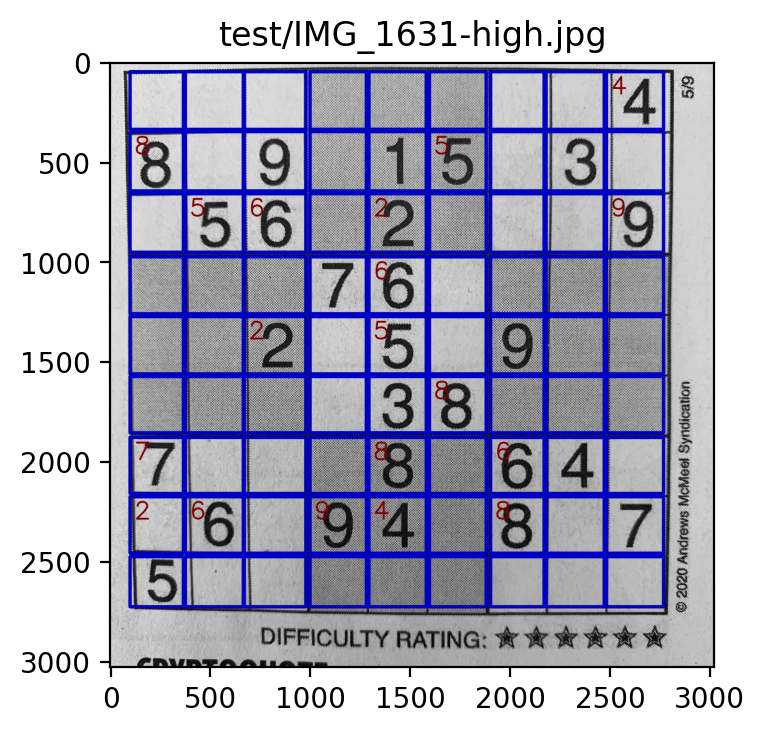

Image: test/Sudoku-2020-10-29.png 		Score: 79


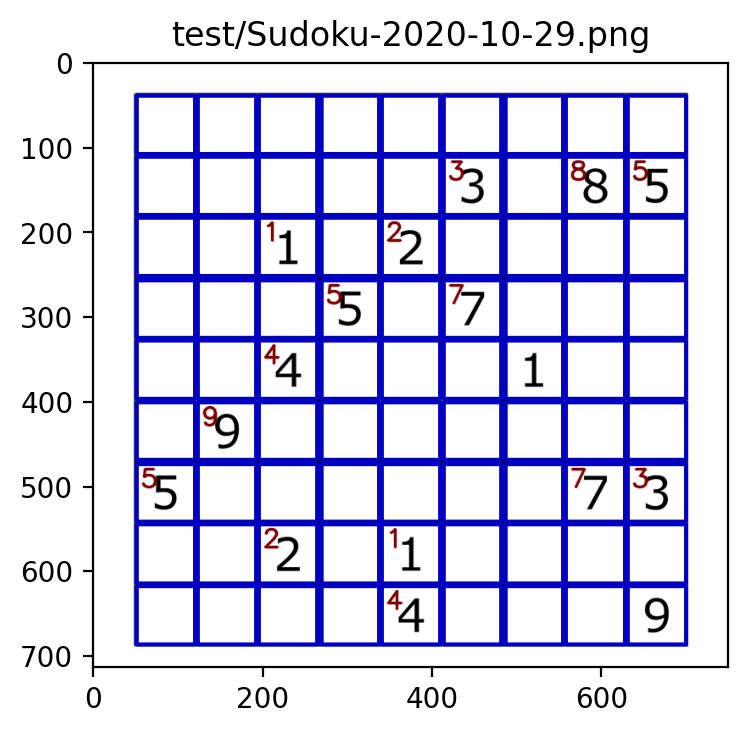

Image: test/Sudoku_20200509.png 		Score: 74


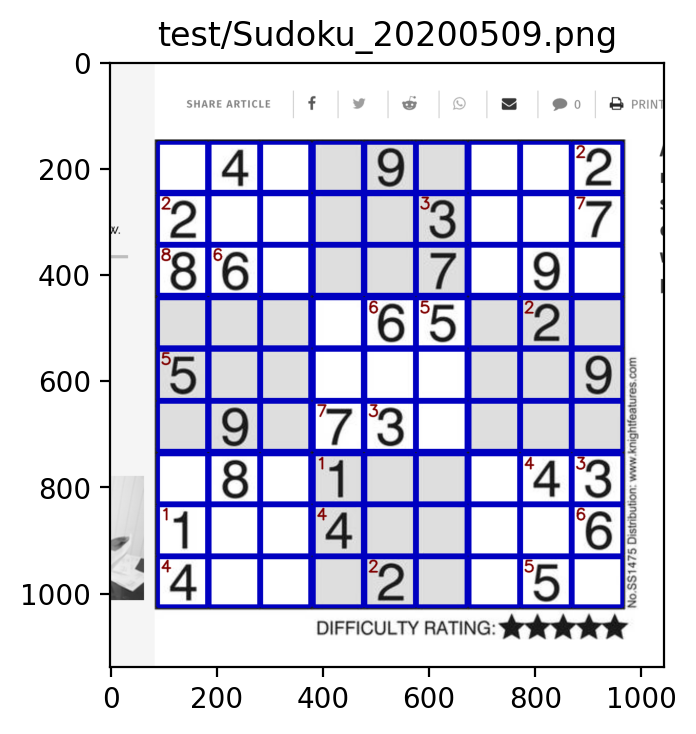

Image: test/sudoku2.png 		Score: 78


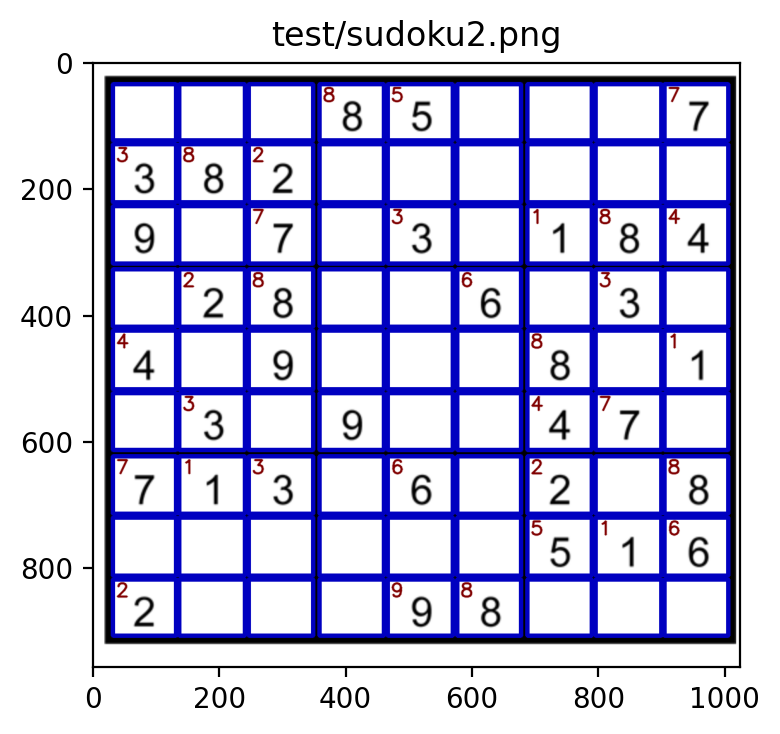

Image: test/sudokupuzzler.26.jpg 		Score: 67


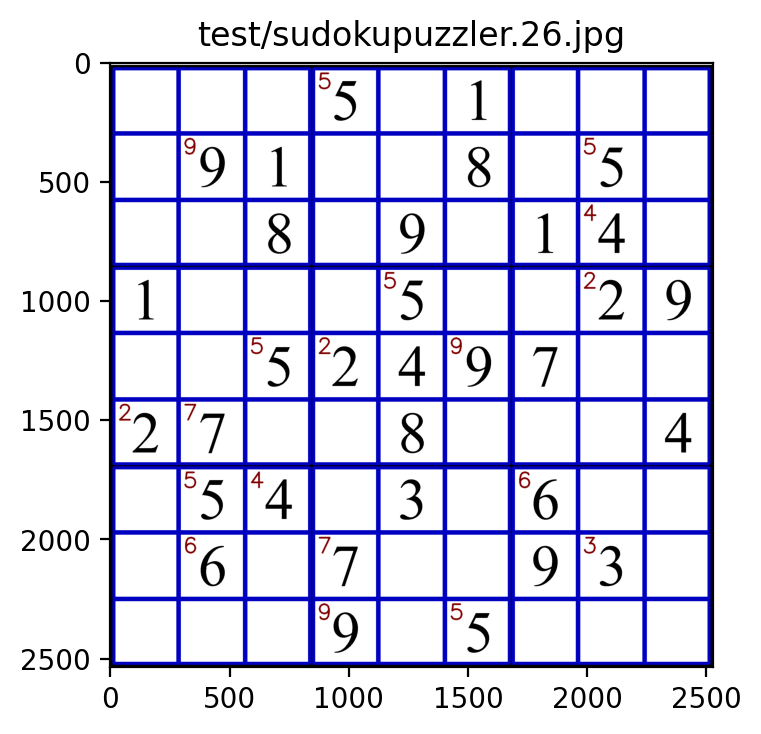

In [25]:
run_test('--psm 10 --oem 3 -l eng -c tessedit_char_whitelist=123456789')
# With oem values of 0,1,2, this fails with the following error:
# Error: Tesseract (legacy) engine requested, but components are not present in /usr/local/share/tessdata/eng.traineddata!! 

Image: test/IMG_1428-low.jpg 		Score: 61


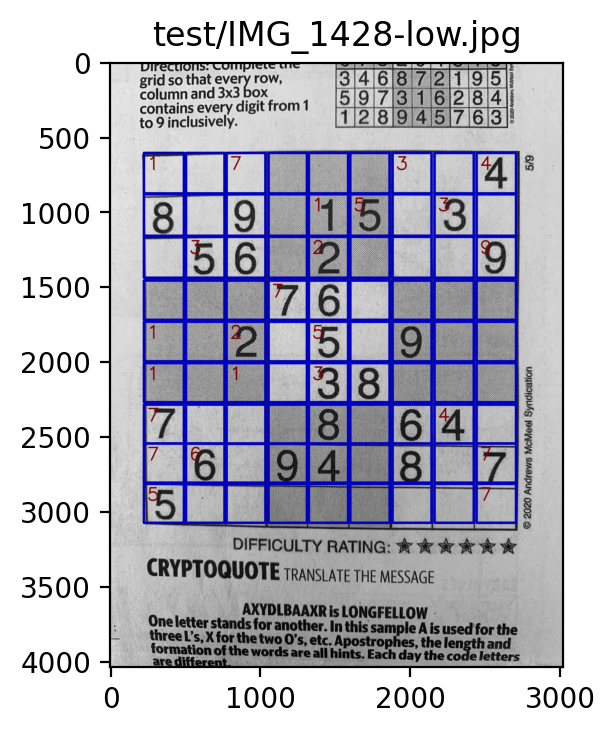

Image: test/IMG_1428-high.jpg 		Score: 64


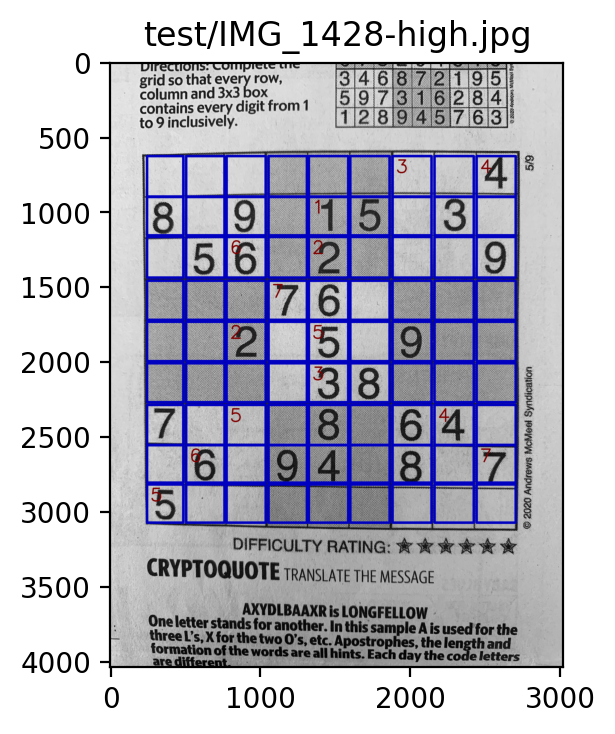

Image: test/IMG_1631-low.jpg 		Score: 63


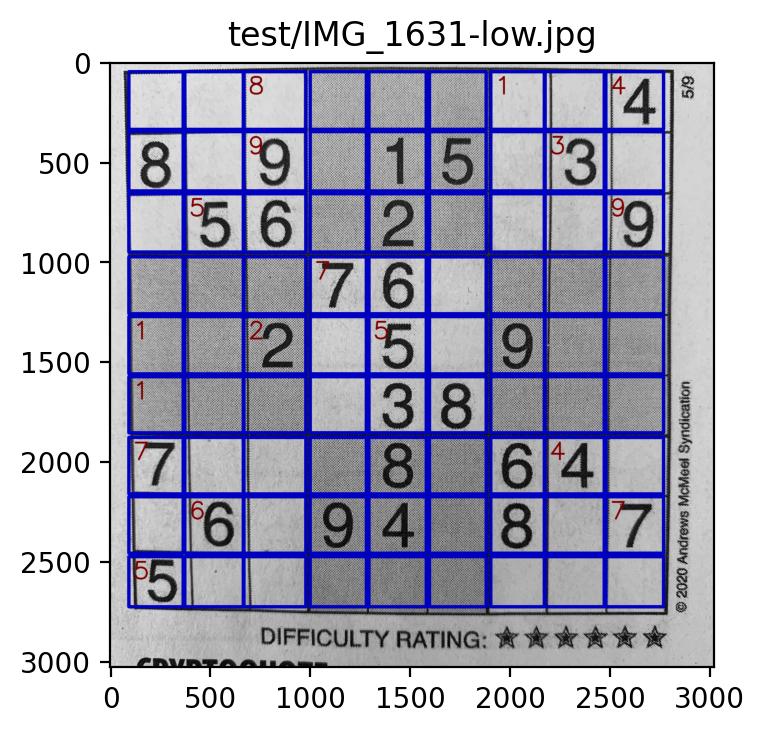

Image: test/IMG_1631-high.jpg 		Score: 66


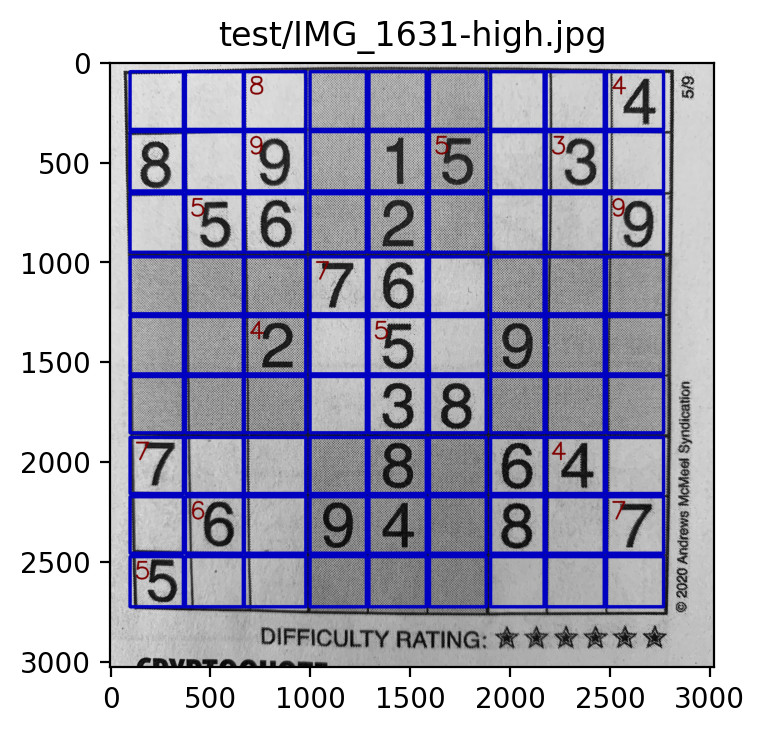

Image: test/Sudoku-2020-10-29.png 		Score: 79


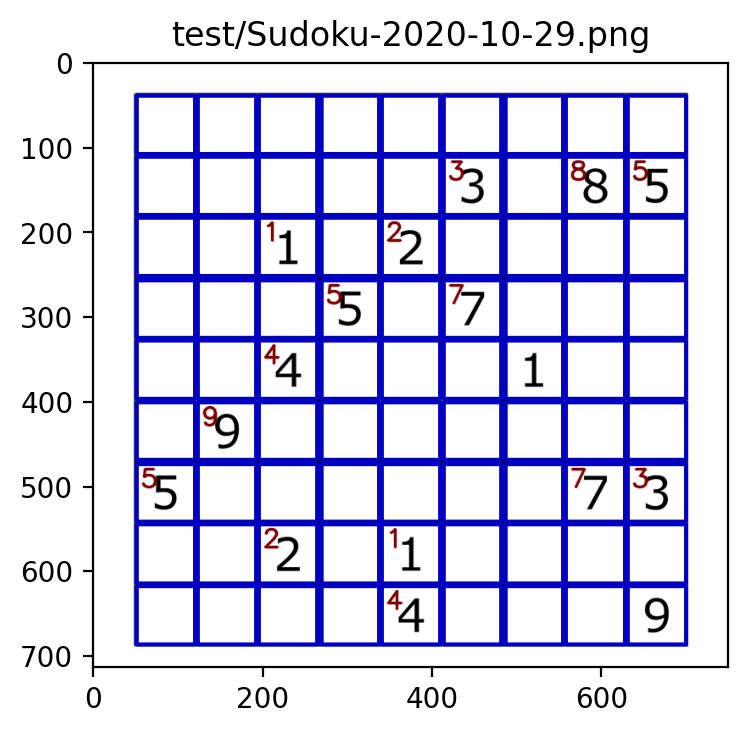

Image: test/Sudoku_20200509.png 		Score: 78


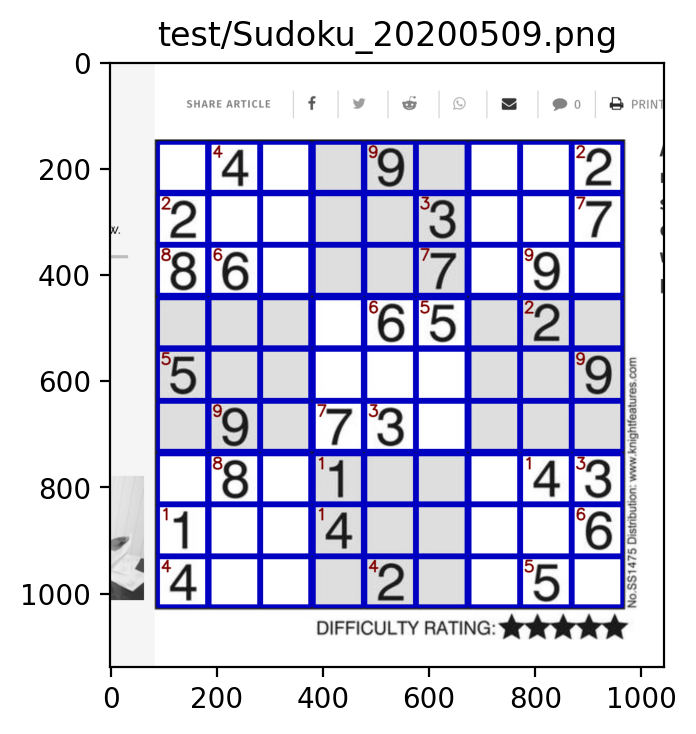

Image: test/sudoku2.png 		Score: 80


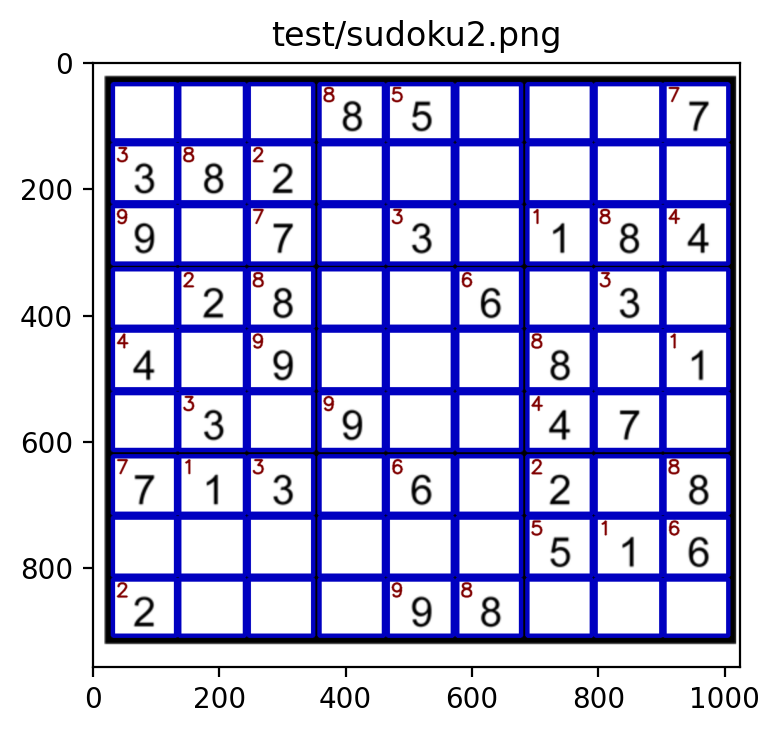

Image: test/sudokupuzzler.26.jpg 		Score: 63


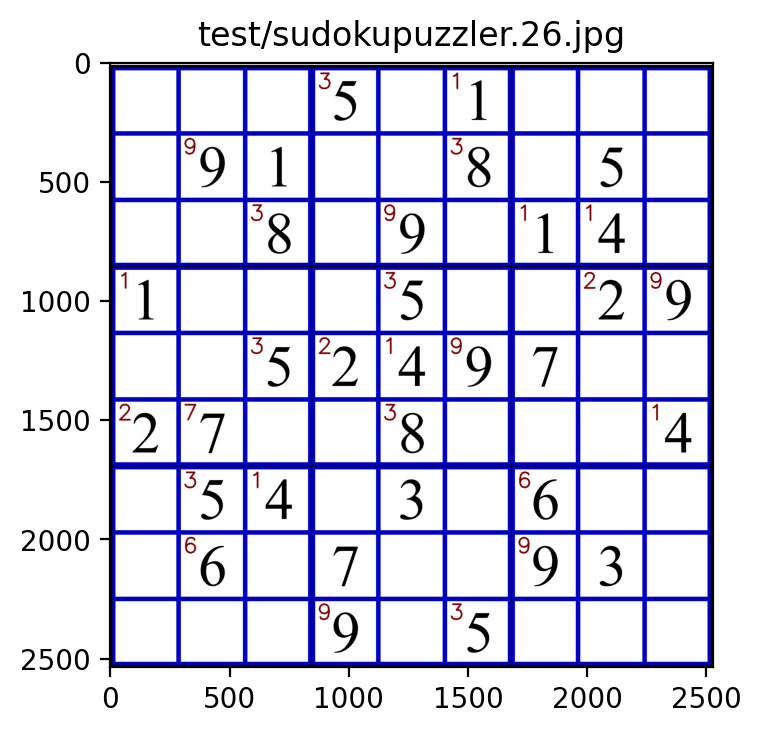

In [26]:
run_test('--psm 10 --oem 3 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Nov_2016')

Image: test/IMG_1428-low.jpg 		Score: 59


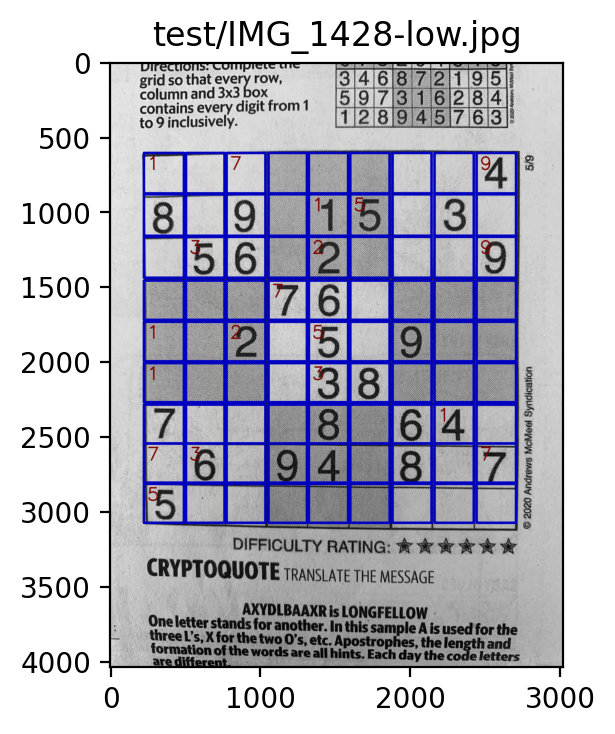

Image: test/IMG_1428-high.jpg 		Score: 62


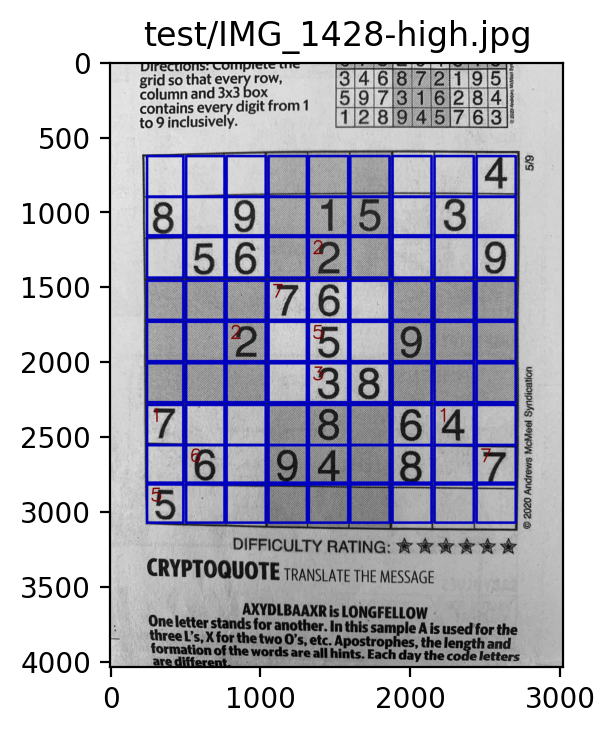

Image: test/IMG_1631-low.jpg 		Score: 57


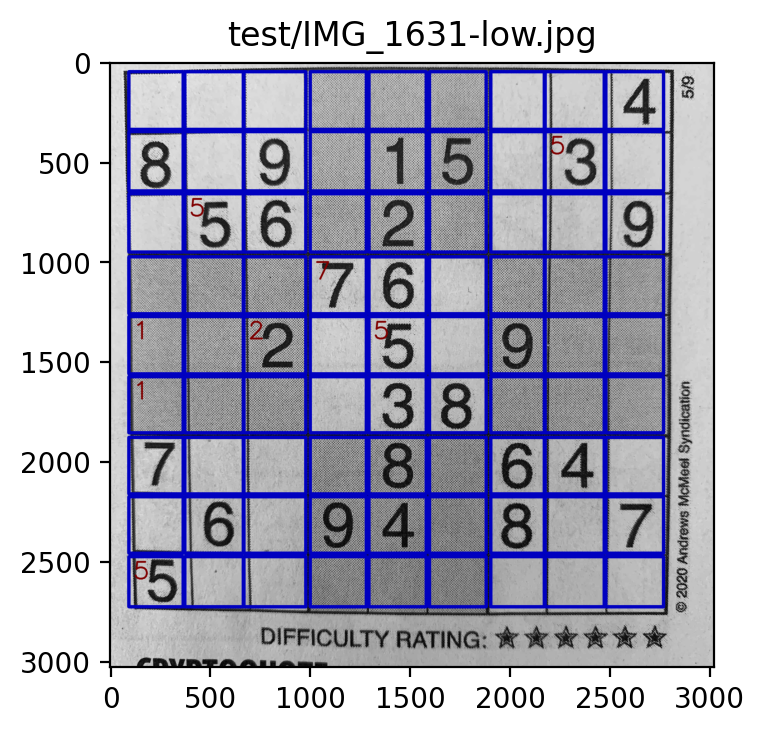

Image: test/IMG_1631-high.jpg 		Score: 62


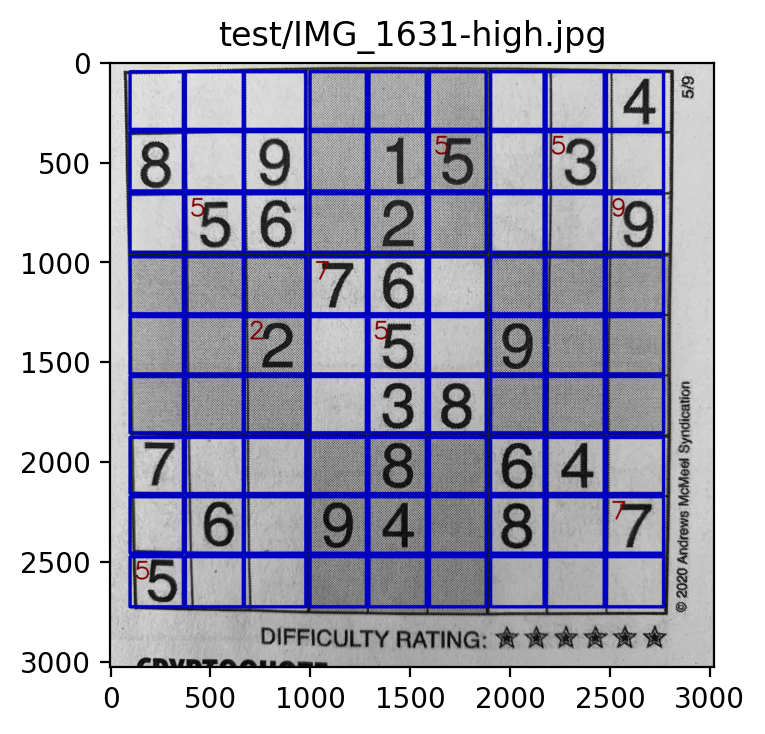

Image: test/Sudoku-2020-10-29.png 		Score: 79


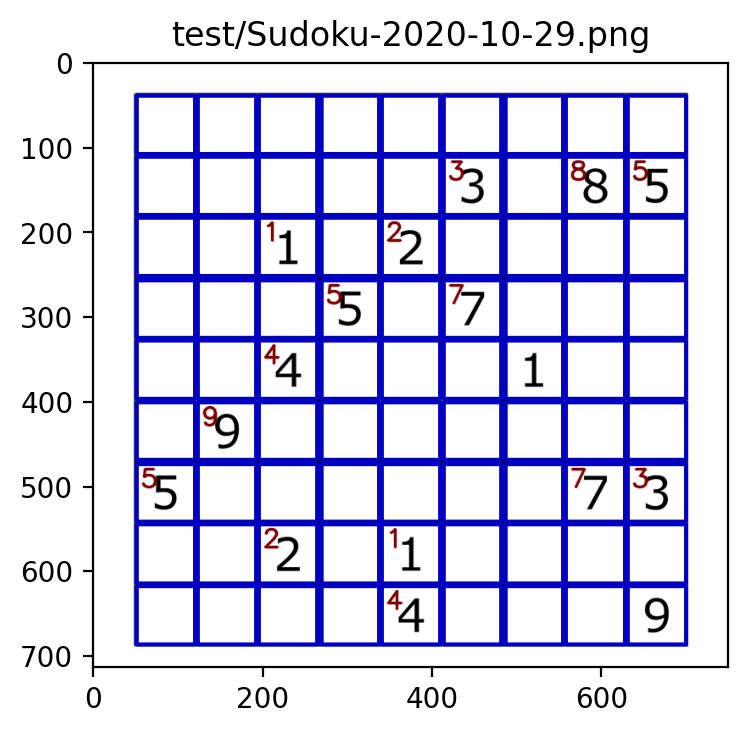

Image: test/Sudoku_20200509.png 		Score: 81


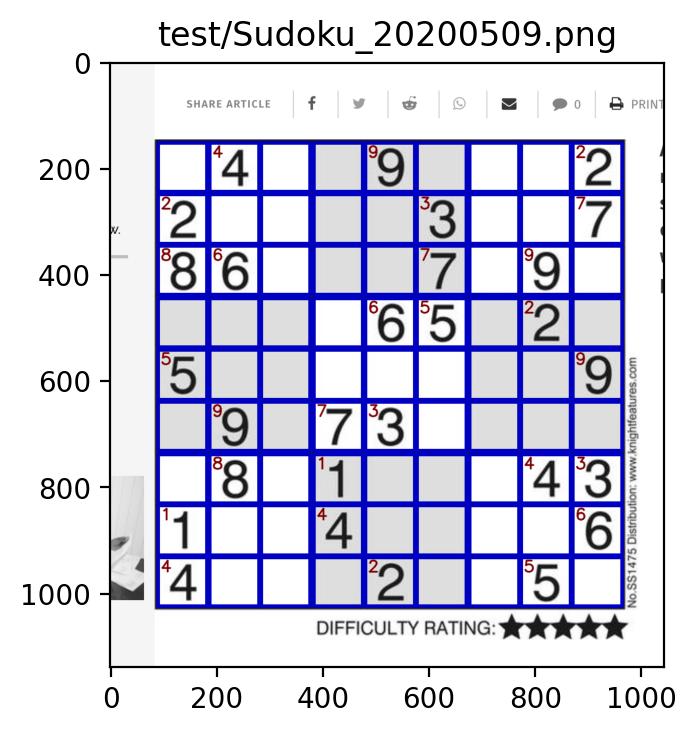

Image: test/sudoku2.png 		Score: 80


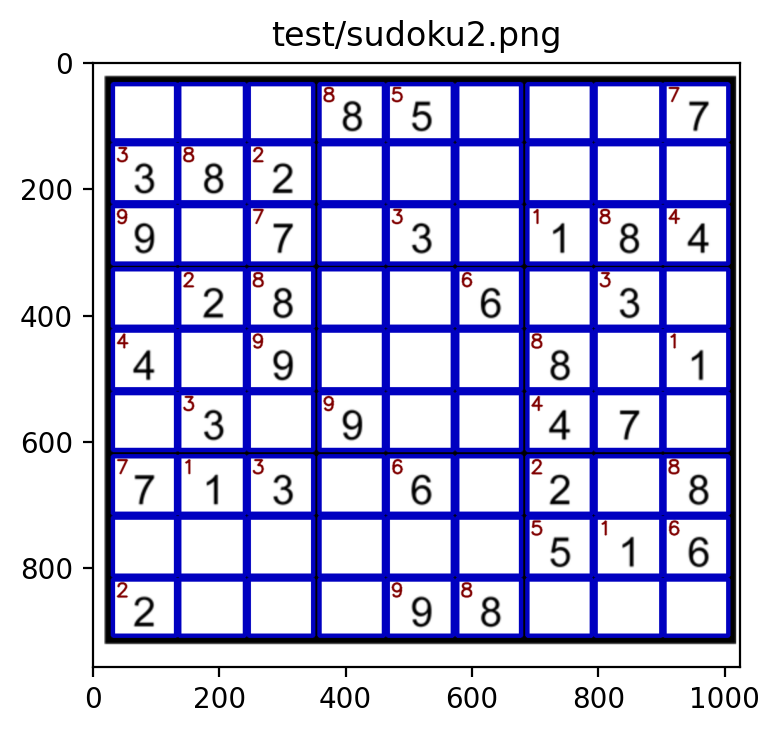

Image: test/sudokupuzzler.26.jpg 		Score: 75


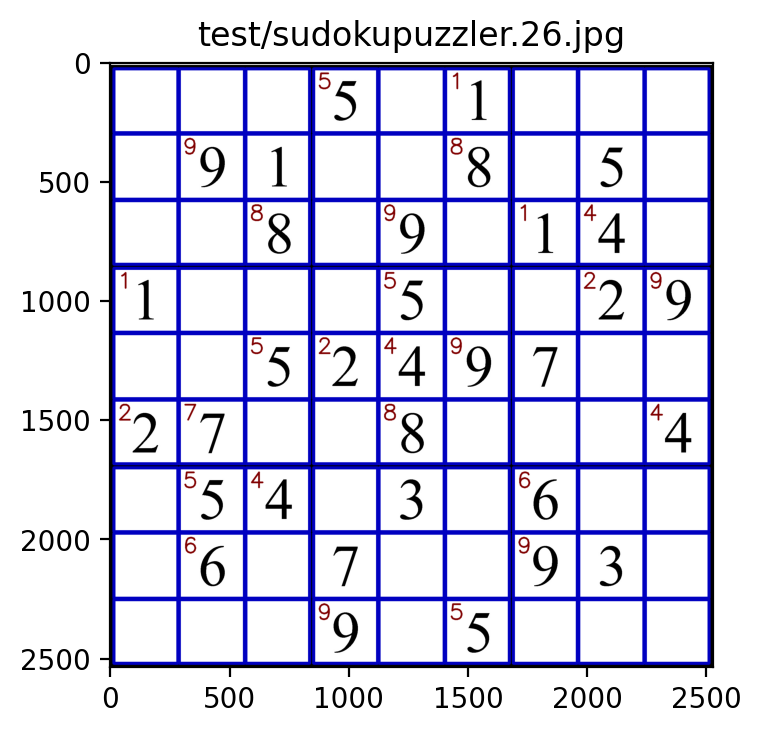

In [27]:
run_test('--psm 10 --oem 0 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Nov_2016')
# This test fails with oem value of 1
#
# This is the best for screen caps

Image: test/IMG_1428-low.jpg 		Score: 61


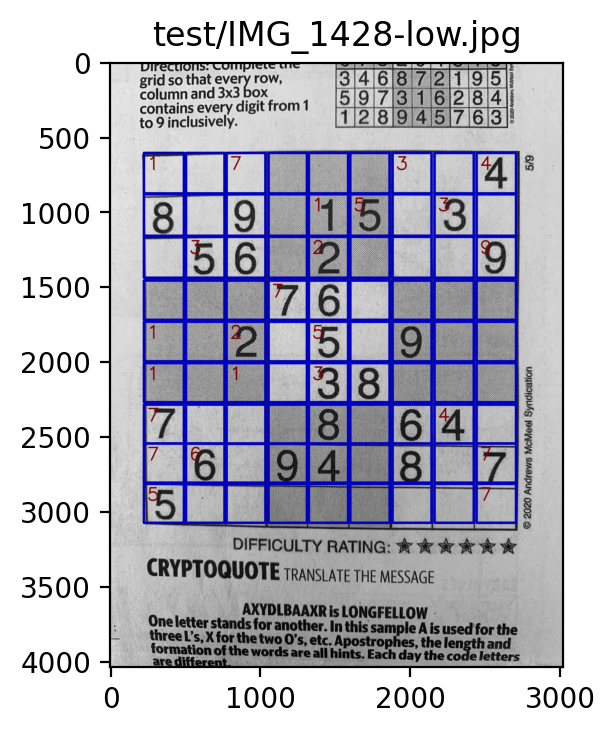

Image: test/IMG_1428-high.jpg 		Score: 64


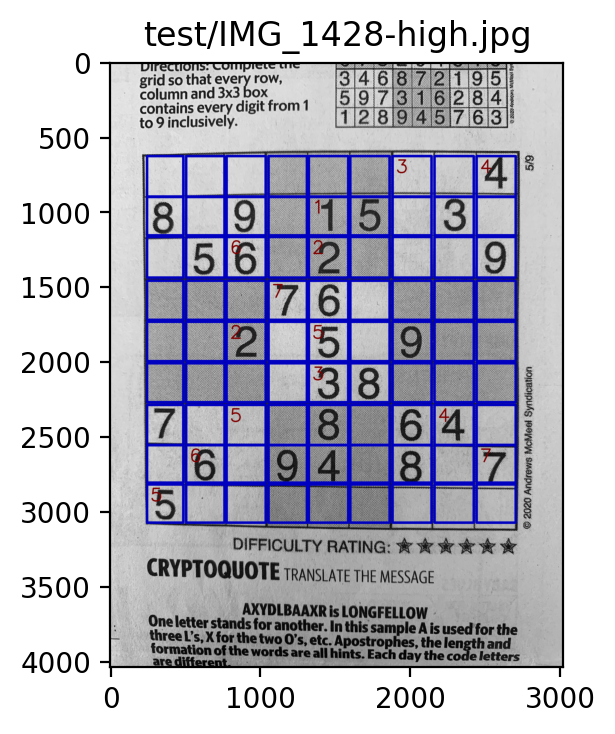

Image: test/IMG_1631-low.jpg 		Score: 63


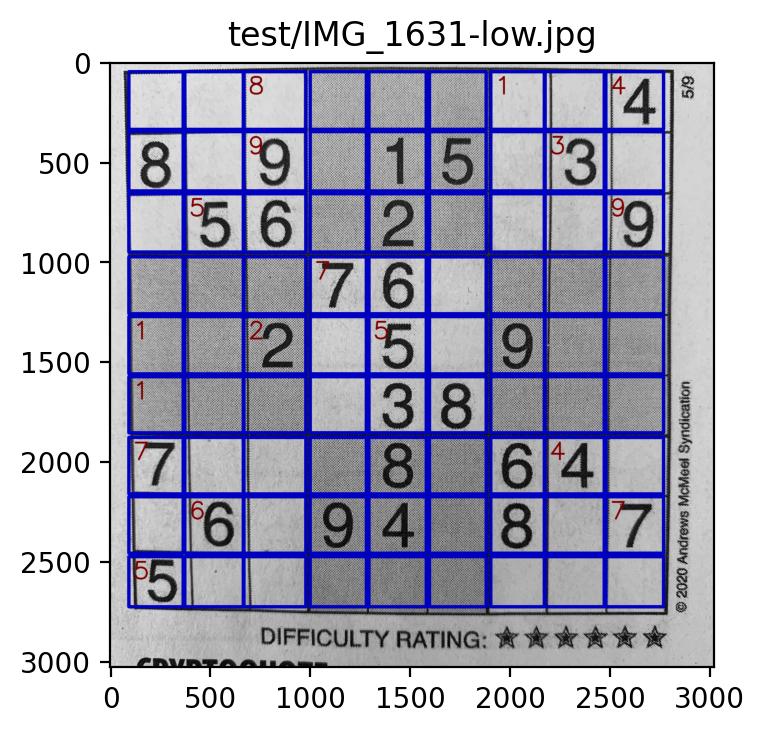

Image: test/IMG_1631-high.jpg 		Score: 66


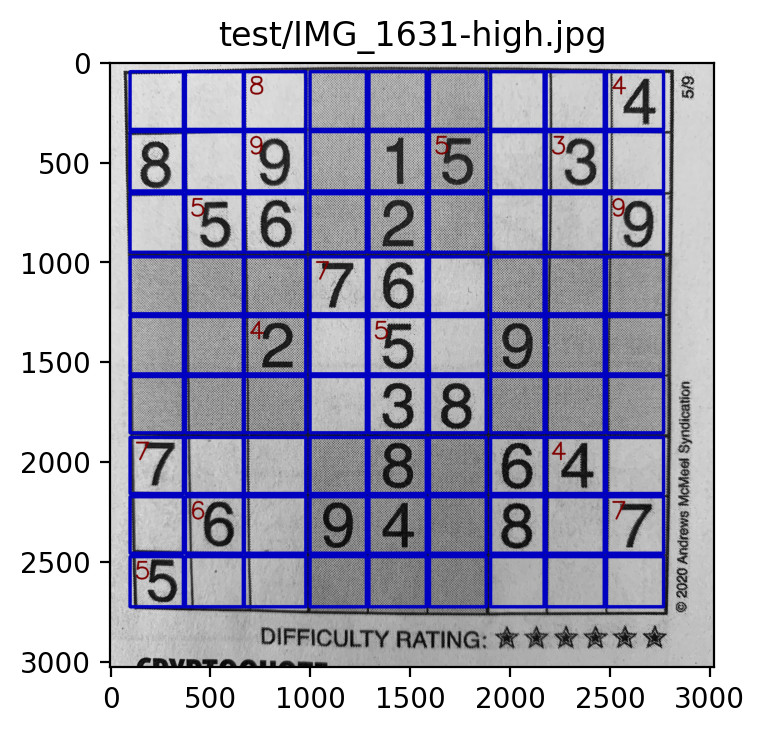

Image: test/Sudoku-2020-10-29.png 		Score: 79


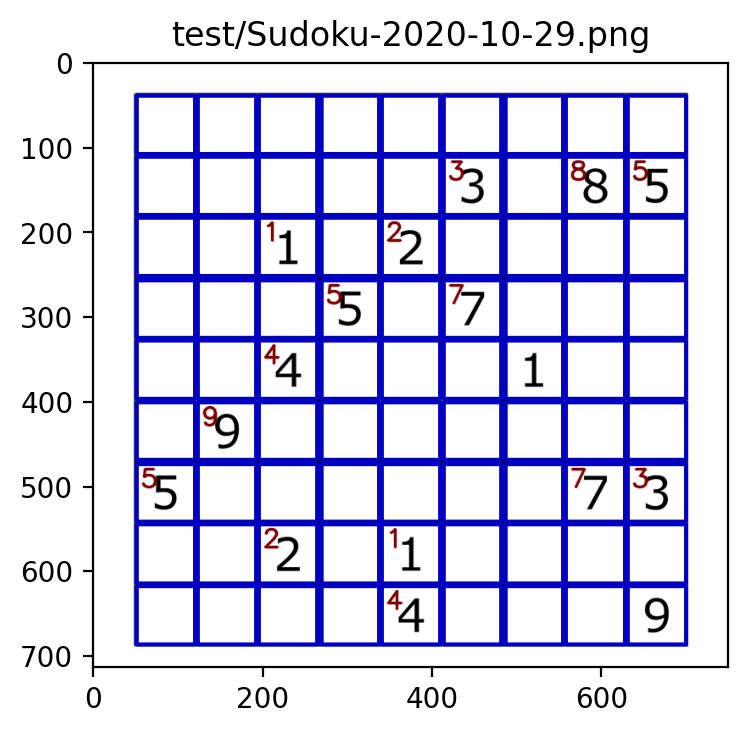

Image: test/Sudoku_20200509.png 		Score: 78


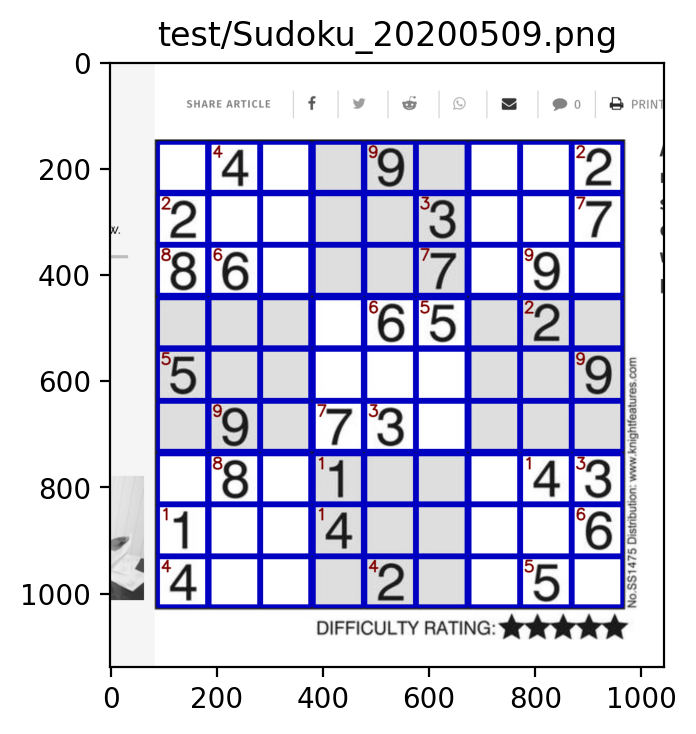

Image: test/sudoku2.png 		Score: 80


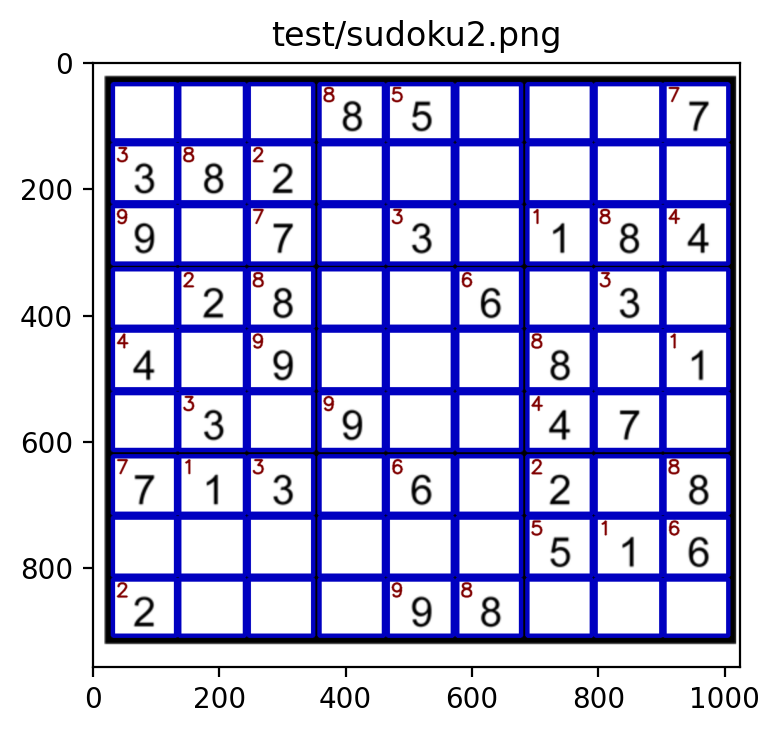

Image: test/sudokupuzzler.26.jpg 		Score: 63


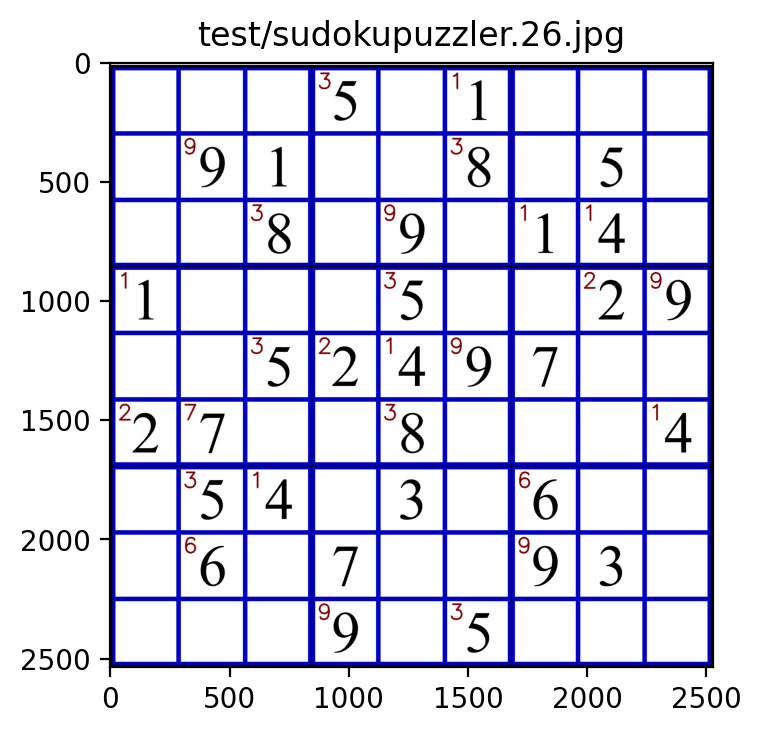

In [28]:
run_test('--psm 10 --oem 2 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Nov_2016')

Image: test/IMG_1428-low.jpg 		Score: 78


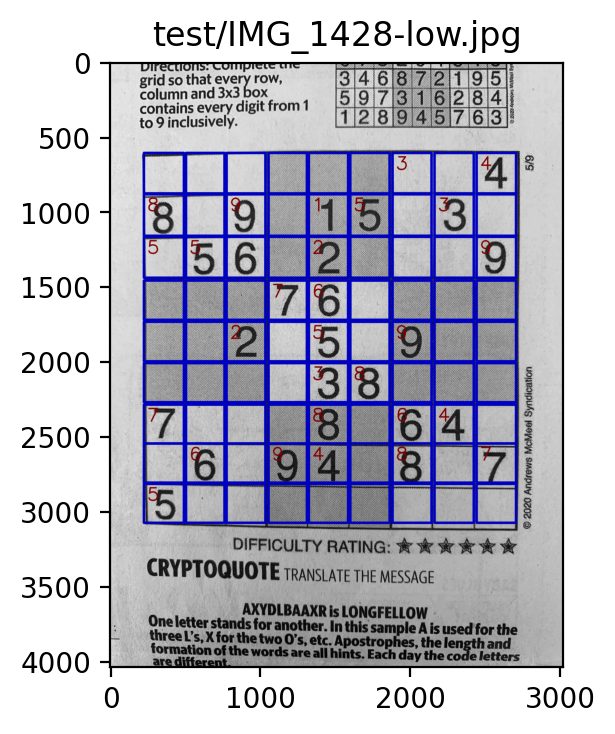

Image: test/IMG_1428-high.jpg 		Score: 80


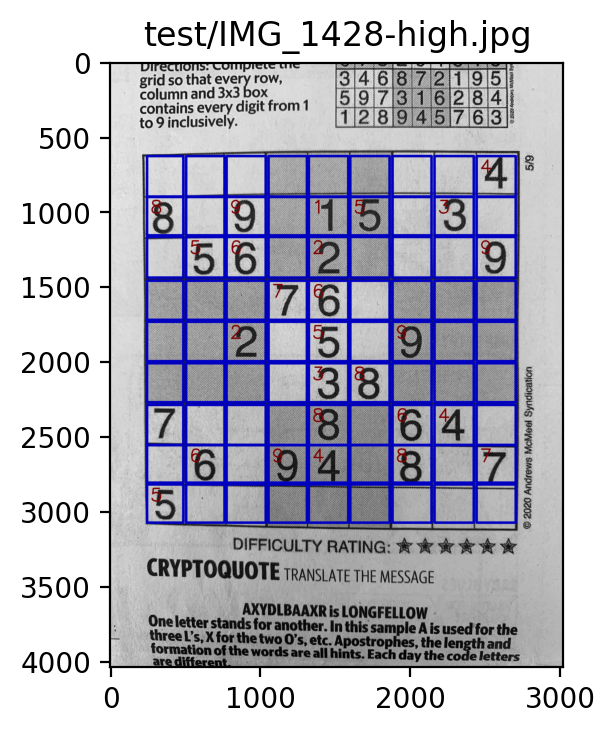

Image: test/IMG_1631-low.jpg 		Score: 78


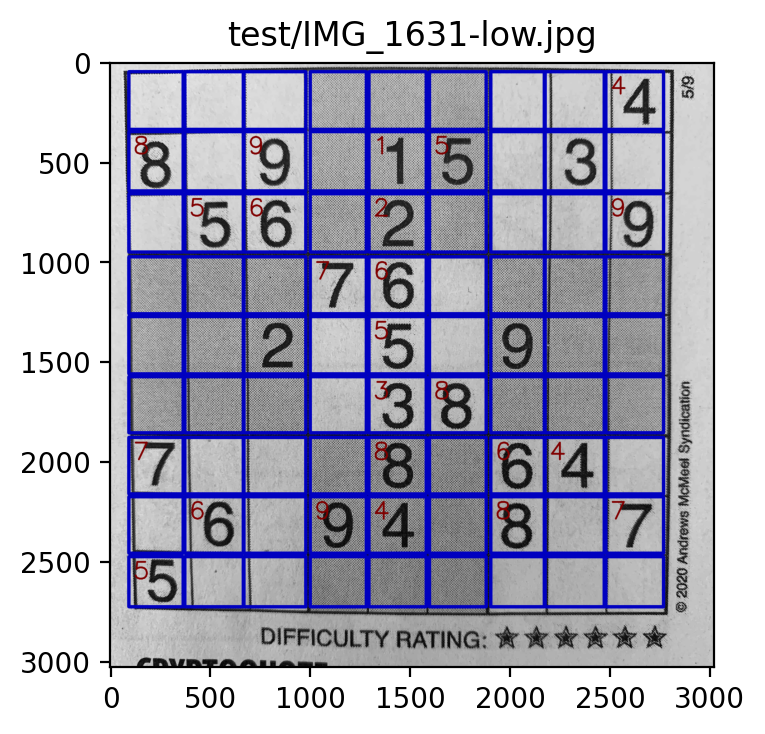

Image: test/IMG_1631-high.jpg 		Score: 79


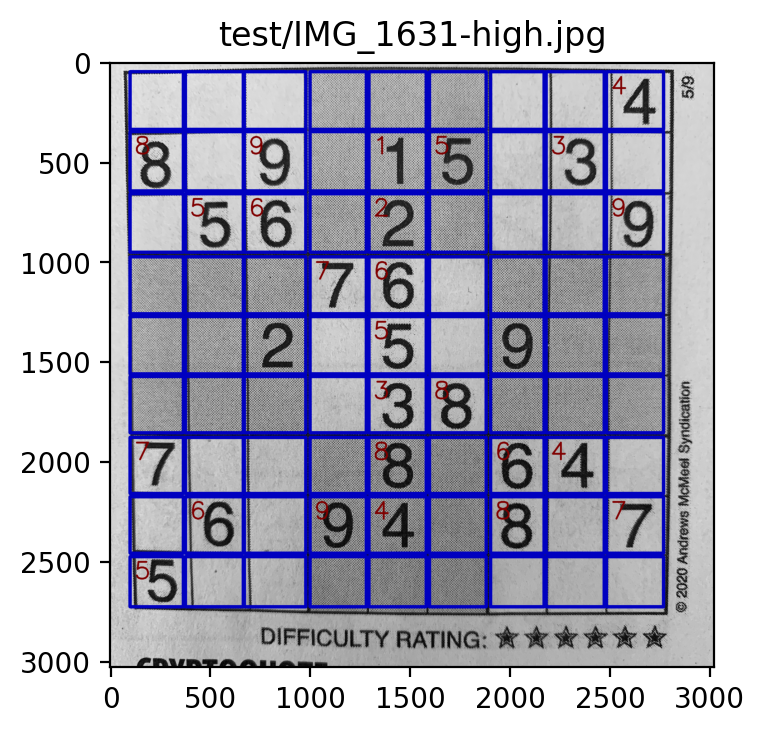

Image: test/Sudoku-2020-10-29.png 		Score: 78


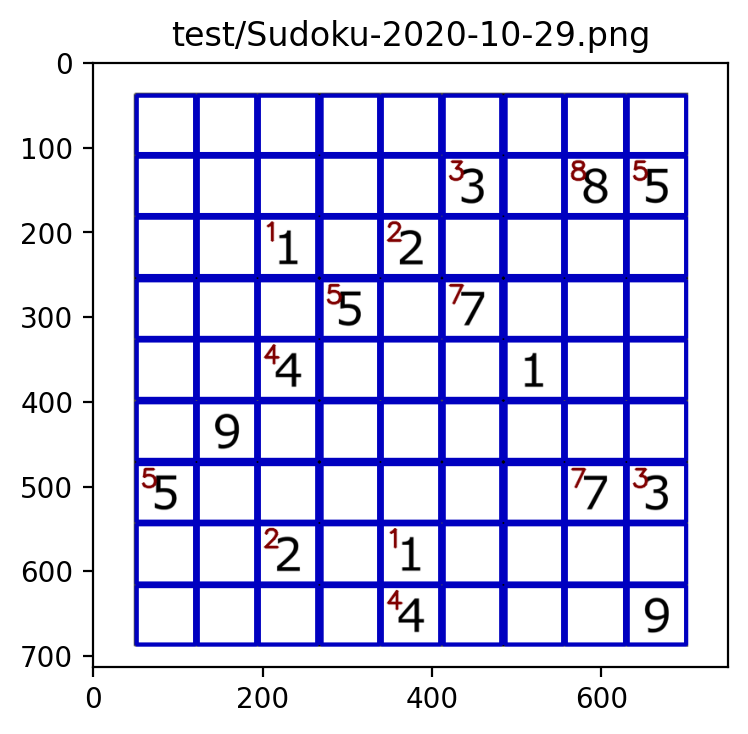

Image: test/Sudoku_20200509.png 		Score: 75


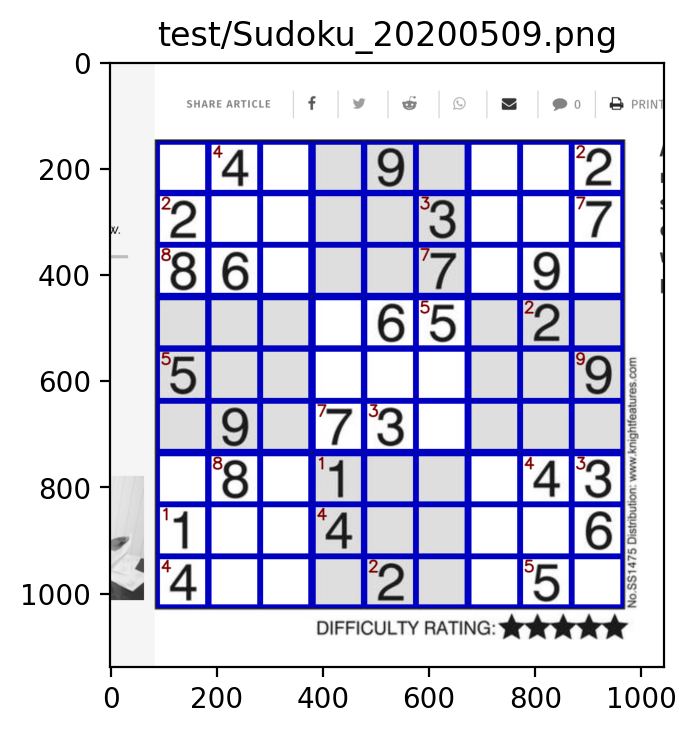

Image: test/sudoku2.png 		Score: 77


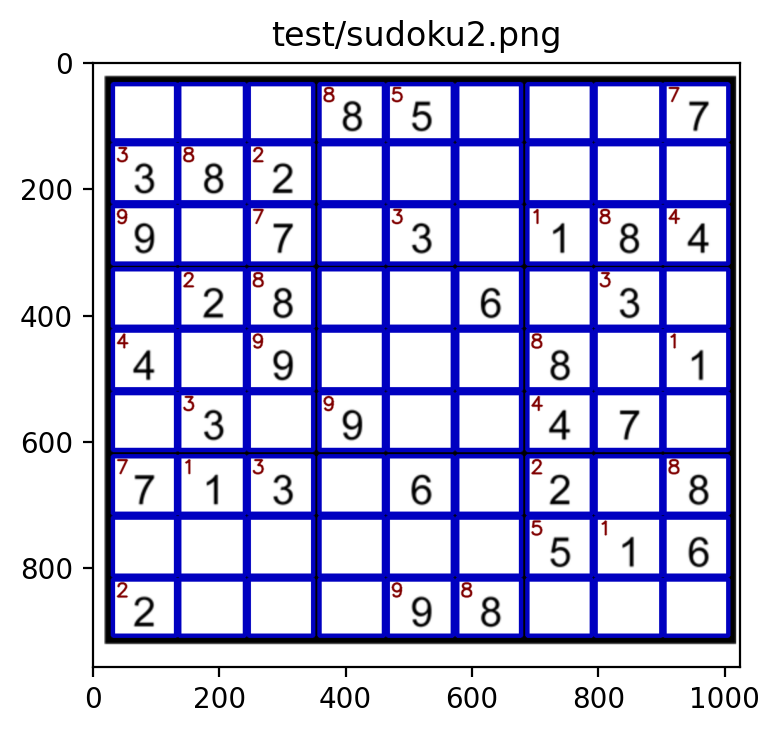

Image: test/sudokupuzzler.26.jpg 		Score: 70


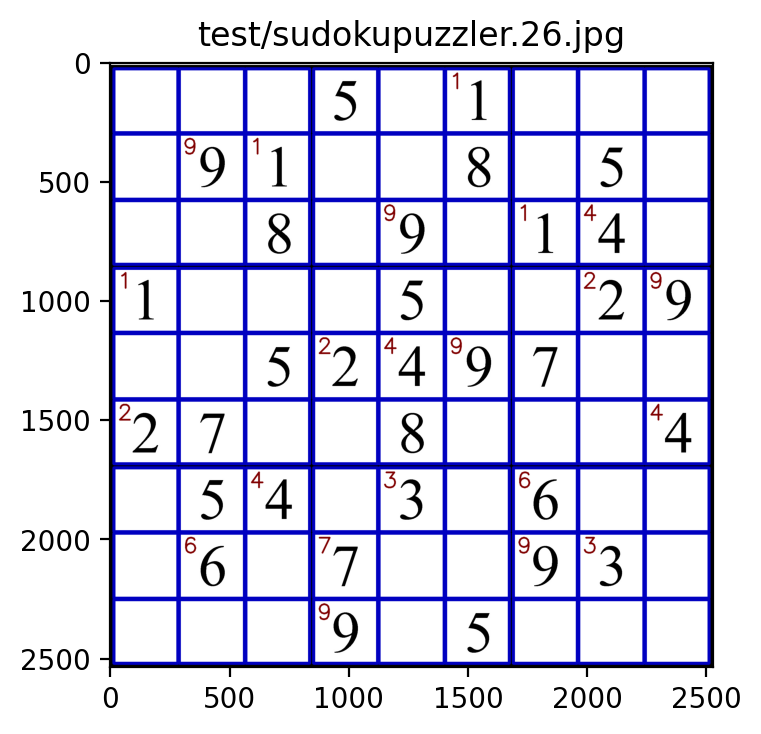

In [29]:
run_test('--psm 10 --oem 3 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Sept_2017')
# This test fails with oem value of 0 and 2
#
# This is tied for the best for digital photos

Image: test/IMG_1428-low.jpg 		Score: 78


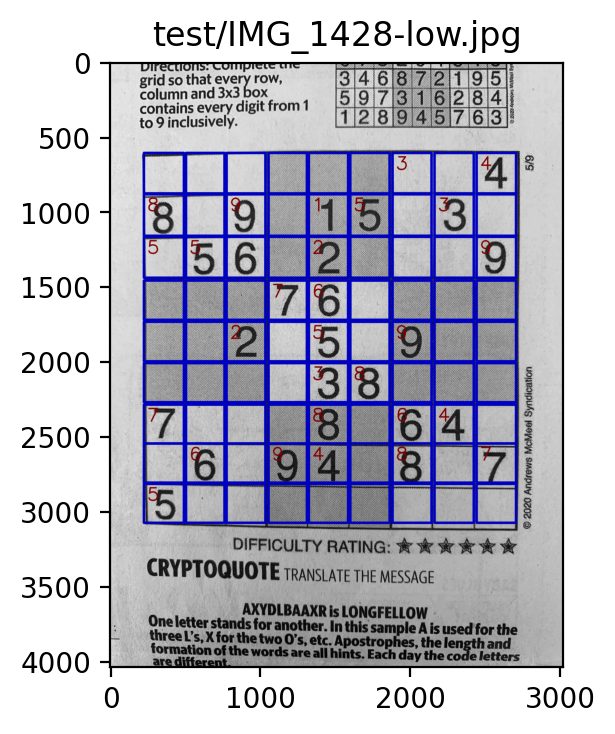

Image: test/IMG_1428-high.jpg 		Score: 80


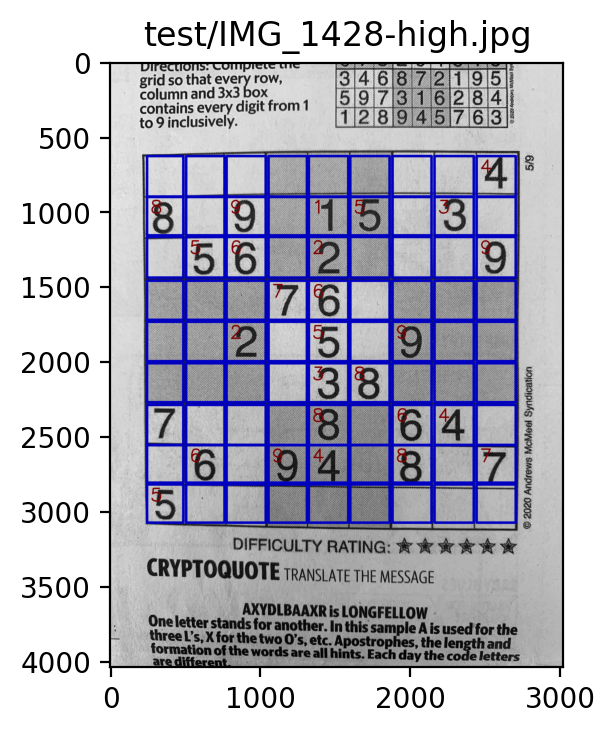

Image: test/IMG_1631-low.jpg 		Score: 78


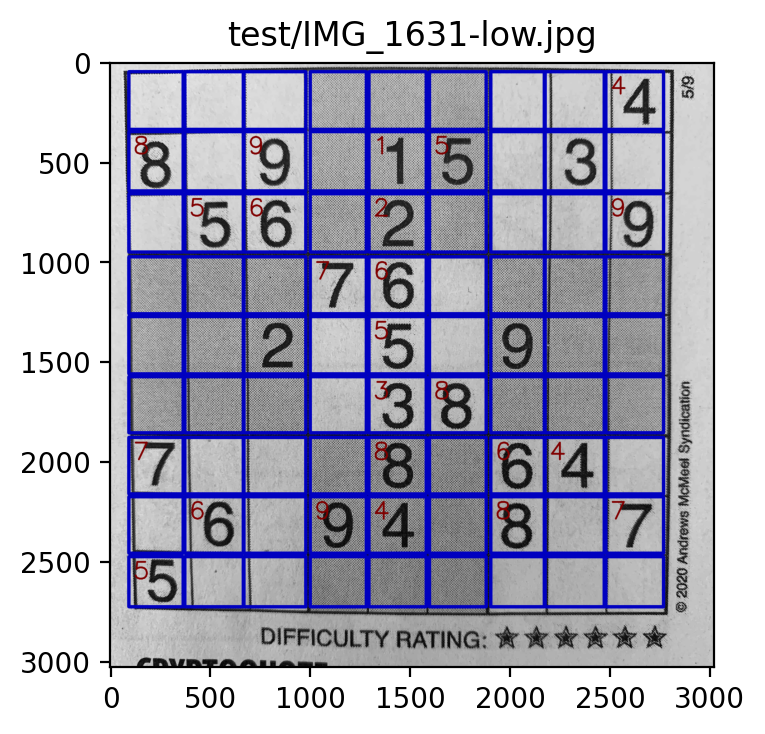

Image: test/IMG_1631-high.jpg 		Score: 79


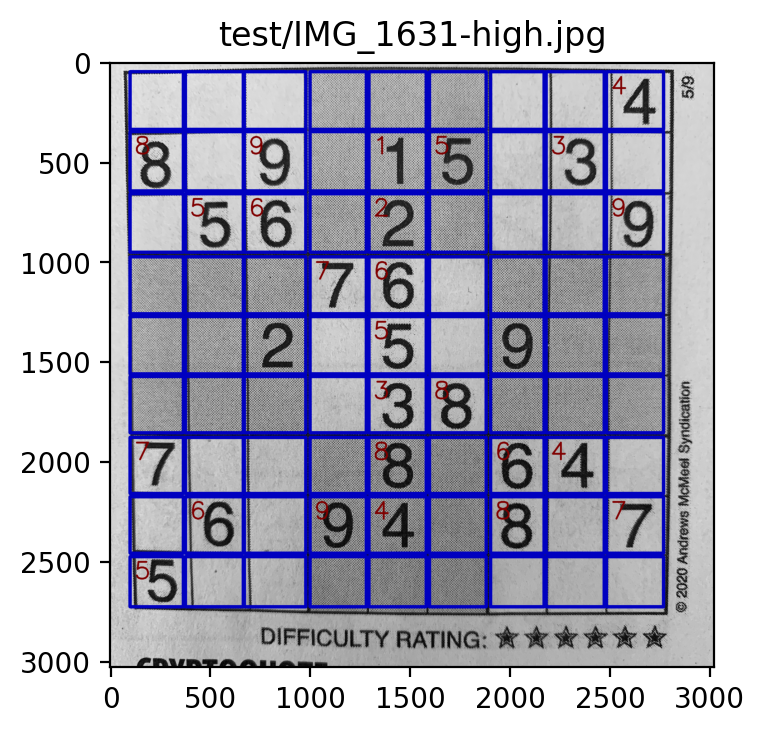

Image: test/Sudoku-2020-10-29.png 		Score: 78


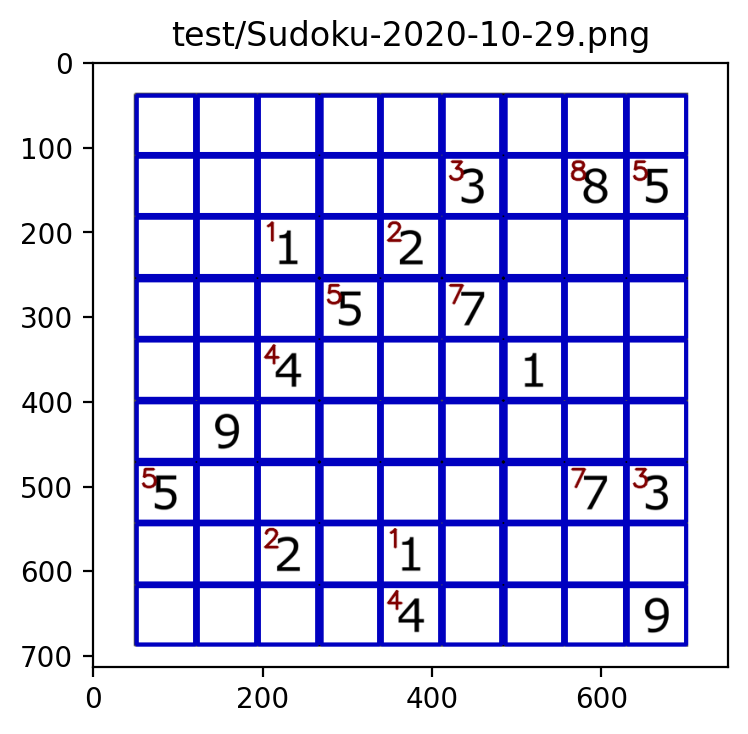

Image: test/Sudoku_20200509.png 		Score: 75


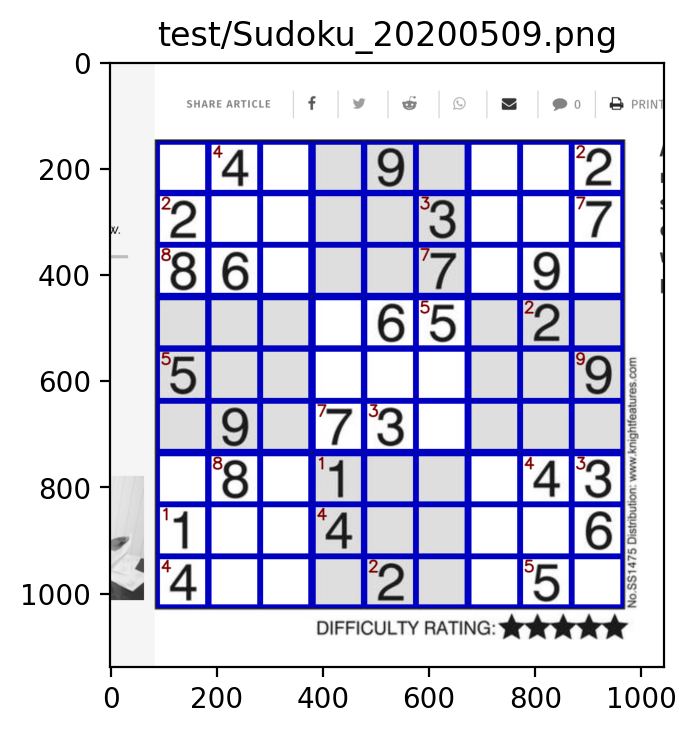

Image: test/sudoku2.png 		Score: 77


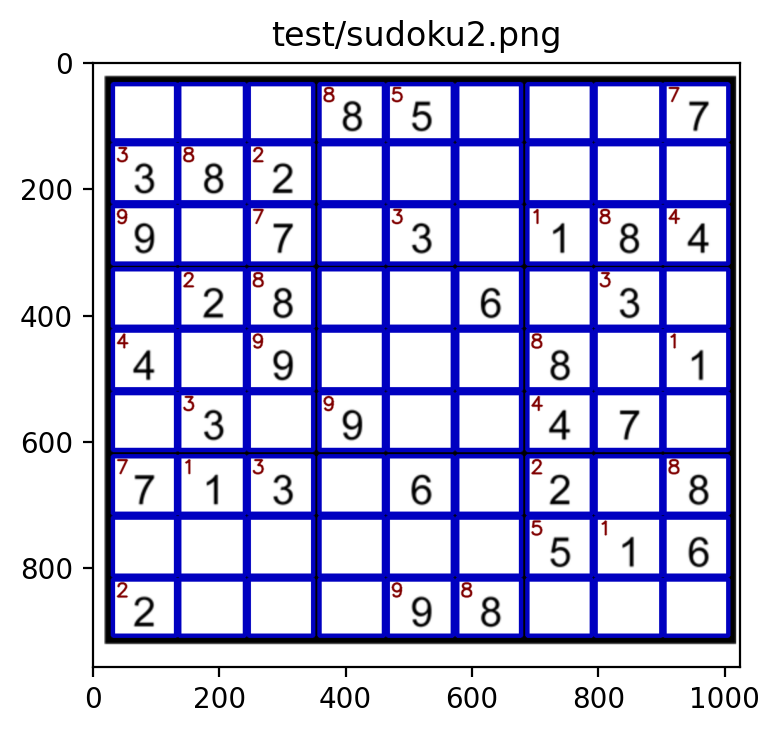

Image: test/sudokupuzzler.26.jpg 		Score: 67


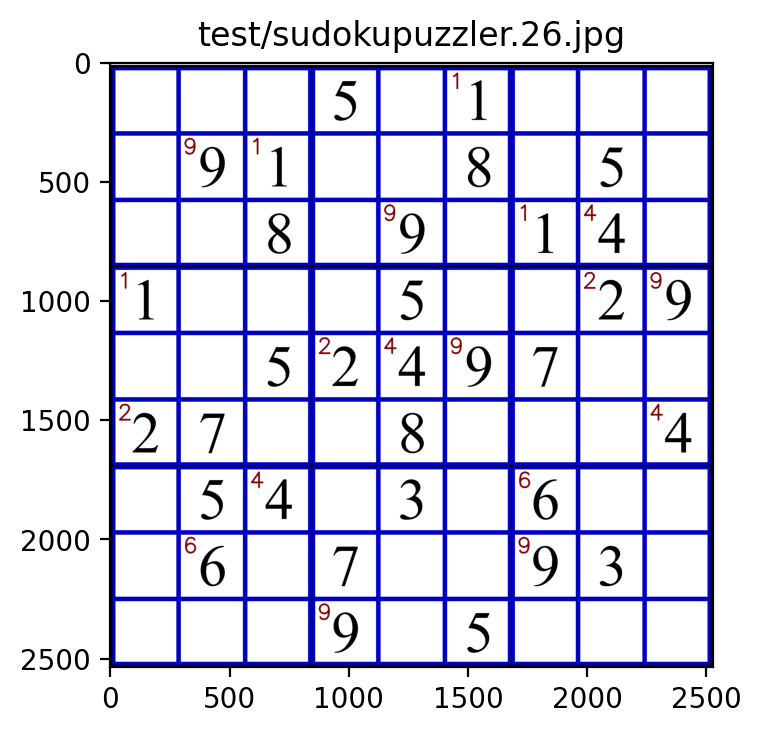

In [30]:
run_test('--psm 10 --oem 1 -l eng -c tessedit_char_whitelist=123456789 --tessdata-dir ./tessdata/4.00_Sept_2017')
#
# This is tied for the best for digital photos